# Постановка проблемы

Одна из проблем компании — это нечестные отели, которые накручивают себе рейтинг. Одним из способов обнаружения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель ведёт себя нечестно, и его стоит проверить.

Цель:
Построить модель машинного обучения, которая предсказывает рейтинг отеля.

Выполняем следующие задачи:
* Загрузка данных.
* Очистка данных.
* Исследование данных.
* Генерация и преобразование признаков.
* Отбор признаков.
* Обучение модели.
* Участие в соревновании на Kaggle

Мой результат на Kaggle: [[SF-DST] Booking reviews Result](https://www.kaggle.com/code/olegatamanov/eda-project-3-model-to-kaggle/notebook?scriptVersionId=194816186)

# Загрузка данных

In [1]:
# загружаем необходимые библиотеки
import pandas as pd
import numpy as np

from scipy import stats
import statsmodels.api as sm
from statsmodels import stats as sms

import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly.express as px

In [2]:
hotels = pd.read_csv('data/hotels.csv')
hotels.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643


# Описательный анализ данных

In [3]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

В датасете 386803 записей (c пропущенными значениями в lat и lng).

In [4]:
# описание числовых признаков
hotels.describe()

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,lat,lng
count,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.00000,386803.000000,384355.000000,384355.000000
mean,498.246536,8.397231,18.538988,2743.992042,17.776985,7.17725,8.396906,49.443522,2.823402
std,500.258012,0.547881,29.703369,2316.457018,21.726141,11.05442,1.636090,3.466936,4.579043
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.00000,2.500000,41.328376,-0.369758
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.00000,7.500000,48.214662,-0.143649
50%,342.000000,8.400000,9.000000,2134.000000,11.000000,3.00000,8.800000,51.499981,-0.000250
75%,660.000000,8.800000,23.000000,3613.000000,22.000000,8.00000,9.600000,51.516288,4.834443
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.00000,10.000000,52.400181,16.429233


In [5]:
# описание категориальных признаков
hotels.describe(include='object')

,hotel_address,review_date,hotel_name,reviewer_nationality,negative_review,positive_review,tags,days_since_review
count,386803,386803,386803,386803,386803,386803,386803,386803
unique,1493,731,1492,225,248828,311737,47135,731
top,163 Marsh Wall Docklands Tower Hamlets London ...,8/2/2017,Britannia International Hotel Canary Wharf,United Kingdom,No Negative,No Positive,"[' Leisure trip ', ' Couple ', ' Double Room '...",1 days
freq,3587,1911,3587,184033,95907,26885,3853,1911


# ОЧИСТКА ДАННЫХ

Проверим данные на наличие полных дубликатов:

In [6]:
print('Количество дубликатов: {}'.format(hotels[hotels.duplicated()].shape[0]))

# Удаляем дубликаты:
#hotels = hotels.drop_duplicates()
#print('Размер таблицы после удаления дубликатов: {}'.format(hotels.shape))

Количество дубликатов: 307


Примечание: дубликаты не удаляем - чтобы сделать Submit в Kuggle

Работа с пропусками

In [7]:
# находим столбцы, где доля пропусков больше 0, сортируем по убыванию
cols_null_percent = hotels.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display(cols_with_null)

lat    0.63288
lng    0.63288
dtype: float64

Заполняем пропуски

In [8]:
# информация о уникальных значений с пропусками
hotels_isnull = hotels[hotels['lat'].isnull() | hotels['lng'].isnull()] 
counts_isnull = hotels_isnull['hotel_name'].value_counts()
display(counts_isnull)

hotel_name
Fleming s Selection Hotel Wien City                 496
Hotel City Central                                  421
Hotel Atlanta                                       285
Maison Albar Hotel Paris Op ra Diamond              224
Hotel Daniel Vienna                                 182
Hotel Pension Baron am Schottentor                  172
Austria Trend Hotel Schloss Wilhelminenberg Wien    141
NH Collection Barcelona Podium                      113
Derag Livinghotel Kaiser Franz Joseph Vienna        112
City Hotel Deutschmeister                            63
Holiday Inn Paris Montmartre                         47
Hotel Park Villa                                     44
Cordial Theaterhotel Wien                            40
Roomz Vienna                                         34
Mercure Paris Gare Montparnasse                      28
Hotel Advance                                        26
Renaissance Barcelona Hotel                          20
Name: count, dtype: int64

In [9]:
# словарь с данными по широте
dict_lat = {'Austria Trend Hotel Schloss Wilhelminenberg Wien': '48.219547925972456', 
                'Holiday Inn Paris Montmartre': '48.889064368690235',
                'Fleming s Selection Hotel Wien City': '48.209427104128665',
                'Hotel Atlanta': '48.2209723965124',
                'Maison Albar Hotel Paris Op ra Diamond': '48.87543722920124',
                'Derag Livinghotel Kaiser Franz Joseph Vienna': '48.24608017805536',
                'Hotel City Central': '48.214201786014854',
                'NH Collection Barcelona Podium': '41.39176529029773',
                'City Hotel Deutschmeister': '48.22103057609981',
                'Hotel Daniel Vienna': '48.18897212994251',
                'Roomz Vienna': '48.22382961585223',
                'Hotel Pension Baron am Schottentor': '48.21692824899107',
                'Mercure Paris Gare Montparnasse': '48.84010021974514',
                'Hotel Park Villa': '48.23759024291264',
                'Hotel Advance': '41.38327316014033',
                'Renaissance Barcelona Hotel': '41.394162363243964',
                'Cordial Theaterhotel Wien': '48.20969901650749'}

# словарь с данными по долготе
dict_lng = {'Austria Trend Hotel Schloss Wilhelminenberg Wien': '16.285565274761424', 
                'Holiday Inn Paris Montmartre': '2.333206641604505',
                'Fleming s Selection Hotel Wien City': '16.353540496647103',
                'Hotel Atlanta': '16.356650516337886',
                'Maison Albar Hotel Paris Op ra Diamond': '2.3234027262612256',
                'Derag Livinghotel Kaiser Franz Joseph Vienna': '16.34202545691955',
                'Hotel City Central': '16.379923233140797',
                'NH Collection Barcelona Podium': '2.1783660658934747',
                'City Hotel Deutschmeister': '16.366622226233126',
                'Hotel Daniel Vienna': '16.3838329415743',
                'Roomz Vienna': '16.393969343883455',
                'Hotel Pension Baron am Schottentor': '16.360055901096636',
                'Mercure Paris Gare Montparnasse': '2.3231778953046462',
                'Hotel Park Villa': '16.34703938556462',
                'Hotel Advance': '2.162964217594162',
                'Renaissance Barcelona Hotel': '2.1748749075722924',
                'Cordial Theaterhotel Wien': '16.351495483903957'}

In [10]:
# заполняем пропуски, вводим данные по широте и устанавливаем тип float64
hotels['lat'] = hotels.apply(lambda x: dict_lat.get(x['hotel_name']) if pd.isnull(x['lat']) else x['lat'], axis=1).astype('float64') 
# заполняем пропуски, вводим данные по долготе и устанавливаем тип float64
hotels['lng'] = hotels.apply(lambda x: dict_lng.get(x['hotel_name']) if pd.isnull(x['lng']) else x['lng'], axis=1).astype('float64') 
#выводим результирующую долю пропусков
hotels.isnull().mean()

hotel_address                                 0.0
additional_number_of_scoring                  0.0
review_date                                   0.0
average_score                                 0.0
hotel_name                                    0.0
reviewer_nationality                          0.0
negative_review                               0.0
review_total_negative_word_counts             0.0
total_number_of_reviews                       0.0
positive_review                               0.0
review_total_positive_word_counts             0.0
total_number_of_reviews_reviewer_has_given    0.0
reviewer_score                                0.0
tags                                          0.0
days_since_review                             0.0
lat                                           0.0
lng                                           0.0
dtype: float64

Работа с выбросами

In [11]:
# описание числовых признаков
hotels.describe()

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,lat,lng
count,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.00000,386803.000000,386803.000000,386803.000000
mean,498.246536,8.397231,18.538988,2743.992042,17.776985,7.17725,8.396906,49.433451,2.892384
std,500.258012,0.547881,29.703369,2316.457018,21.726141,11.05442,1.636090,3.460946,4.666158
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.00000,2.500000,41.328376,-0.369758
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.00000,7.500000,48.214202,-0.143372
50%,342.000000,8.400000,9.000000,2134.000000,11.000000,3.00000,8.800000,51.499981,0.019886
75%,660.000000,8.800000,23.000000,3613.000000,22.000000,8.00000,9.600000,51.516288,4.841163
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.00000,10.000000,52.400181,16.429233


Выведем визуальное представление числовых признаков

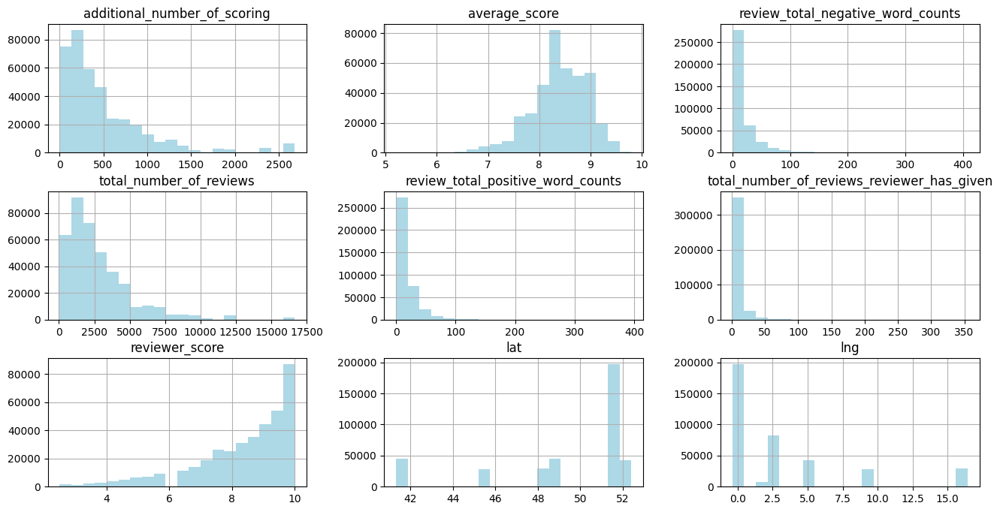

In [12]:
# список с названием числовых признаков
num_col_list = hotels.select_dtypes(include='number').columns.to_list()

# гистограммы числовых признакав для первичной визуальной оценки
hotels[num_col_list].hist(figsize=(16, 8), color='lightblue', bins=20);

Числовые данные выглядят отлично от нормальных, avarage_score выглядит близко к нормальному. Расмотрим этот признак подробнее

In [13]:
# построим гистограмму с ящиком
fig = px.histogram(
    data_frame=hotels, 
    x='average_score', 
    nbins=60,
    marginal='box',
    title='Распределение среднего балла отеля',
)
fig.update_layout(
    xaxis_title='средний балл отеля', 
    yaxis_title='Количество отзывов', 
    bargap=0.2)
fig.show()

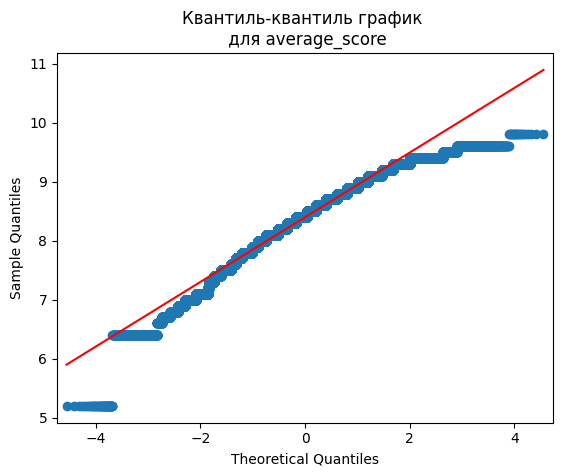

In [14]:
# задаём параметры квантиль-квантиль графика
sm.qqplot(hotels.average_score, line='s')
plt.title('Квантиль-квантиль график \n для average_score')
# отображаем квантиль-квантиль график
plt.show()

Распределение для average_score не нормальное. Медианное значение 8.4. Видны выбросы. Расмотрим выброс со значением average_score = 5.2

In [15]:
print('Кол-во отзывов с average_score = 5.2: {}'.format(hotels[hotels['average_score'] == 5.2].shape[0]))

Кол-во отзывов с average_score = 5.2: 44


Предположим что отзывы могут занижать некоторые конкуренты и выделим отзывы с average_score = 5.2 и ниже чем reviewer_score

In [16]:
outliers = hotels[(hotels['average_score'] < hotels['reviewer_score']) & (hotels['average_score'] == 5.2)]
print('Кол-во отзывов с average_score = 5.2 и ниже чем reviewer_score: {}'.format(outliers.shape[0]))

Кол-во отзывов с average_score = 5.2 и ниже чем reviewer_score: 21


Удалим найденные отзывы

In [17]:
#hotels = hotels.drop(outliers.index, axis=0)
#print(f'Результирующее число записей: {hotels.shape[0]}')

Примечание: отзывы не удаляем - чтобы сделать Submit в Kuggle

# Визуальный анализ данных

Расмотрим визуальное представление распределения данных с фокусом на целевой показатель reviewer_score

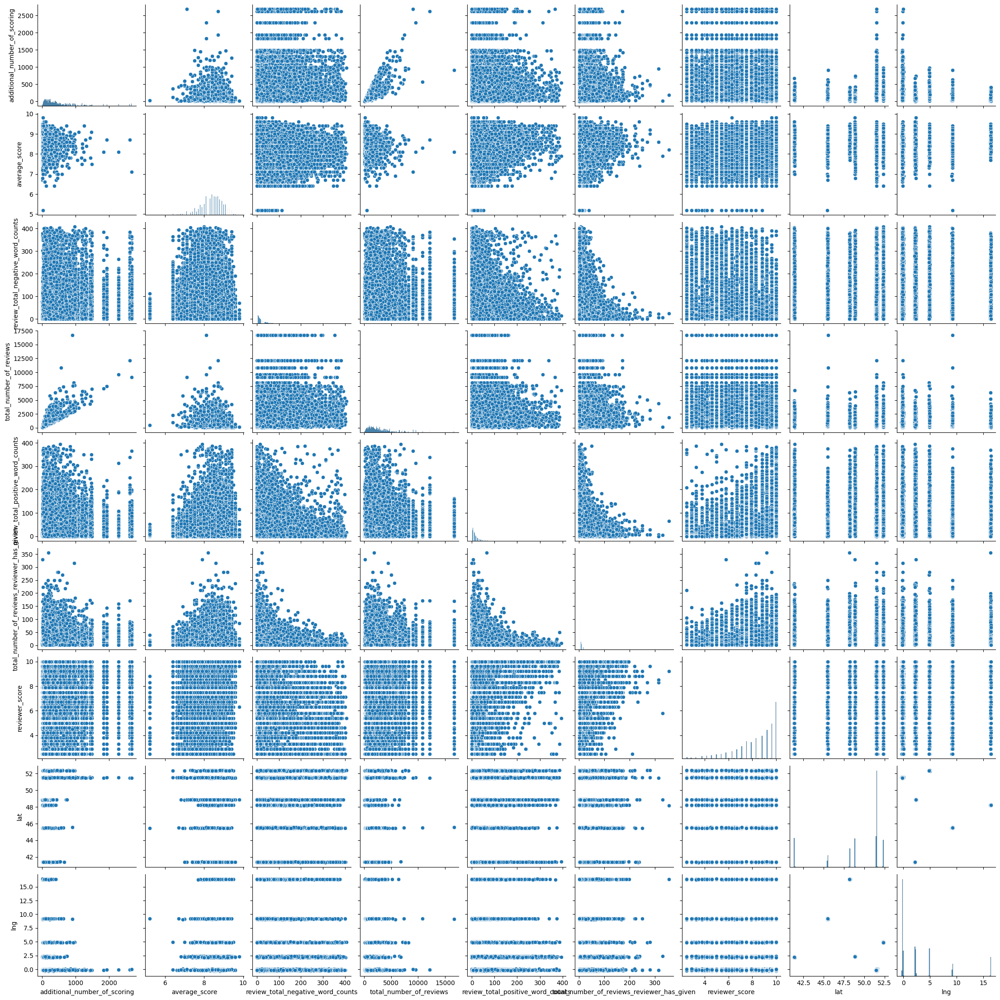

In [18]:
num_col = hotels.select_dtypes(include='number')
sns.pairplot(num_col)

Text(0.5, 1.0, 'Тепловая карта корреляций')

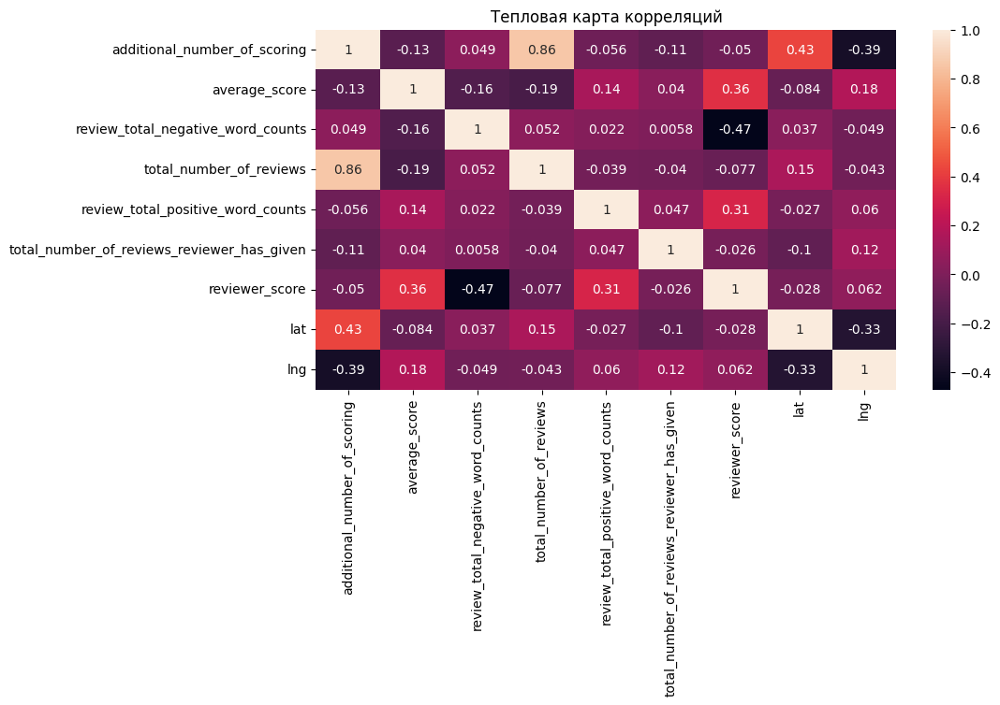

In [19]:
# Тепловая карта корреляций
fid, axes = plt.subplots(ncols=1, nrows=1, figsize=(10,5))
sns.heatmap(data=num_col.corr(method='spearman'), annot=True)
plt.title('Тепловая карта корреляций')

Видна сильная зависимость признаков 'additional_number_of_scoring' и 'total_number_of_reviews'

# РАЗВЕДЫВАТЕЛЬНЫЙ АНАЛИЗ ДАННЫХ. OБРАБОТКА ДАННЫХ

Выполним задание 4.2

In [20]:
display('Кол-во уникальных названий отелей представлено в наборе данных: {}'.format (len(hotels['hotel_name'].unique())))

'Кол-во уникальных названий отелей представлено в наборе данных: 1492'

Обработаем признак review_date и выполним задание 4.3

In [21]:
# изменение типа данных признака review_date
hotels['review_date'] = pd.to_datetime(hotels['review_date'], format='%m/%d/%Y')
hotels['review_date'].max()
hotels['review_date'].min()
display('Cамый свежий отзыв: {}'.format (hotels['review_date'].max()))
display('Cамый первый отзыв: {}'.format (hotels['review_date'].min()))

'Cамый свежий отзыв: 2017-08-03 00:00:00'

'Cамый первый отзыв: 2015-08-04 00:00:00'

In [22]:
# Создадим новые признаки: год, месяц, день, квартал, неделя и день недели
hotels['review_year'] = hotels['review_date'].dt.year
hotels['review_month'] = hotels['review_date'].dt.month
hotels['review_day'] = hotels['review_date'].dt.day
hotels['week'] = hotels['review_date'].dt.isocalendar().week
hotels['quarter'] = hotels['review_date'].dt.quarter
hotels['dayofweek'] = hotels['review_date'].dt.dayofweek

# удалим признак review_date
hotels = hotels.drop(columns=['review_date'], axis=1)

Обработаем признак days_since_review и преобразуем в число

In [23]:
hotels['days_since_review'] = hotels['days_since_review'].apply(lambda x: int(x.replace(' days', '').replace(' day', '')))

Обработаем признак tags и выполним задание 4.4

In [24]:
# функция для очистки tags
def clean_tags(args):
    tag_list = []
    clean_list = args.replace("'", "").replace("[","").replace("]","").split(",")
    for i in clean_list:
        j = i.strip()
        tag_list.append(j)

    return tag_list

In [25]:
# преобразование тэгов в датафрейме
hotels['tags'] = hotels['tags'].apply(clean_tags)

In [26]:
display('Кол-во уникальных тегов: {}'.format (len(hotels.tags.explode().unique())))


'Кол-во уникальных тегов: 2368'

Выделим 15 наиболее распростараненных тэгов 

In [27]:
top_tags = hotels['tags'].explode().value_counts().head(15).index
top_tags

Index(['Leisure trip', 'Submitted from a mobile device', 'Couple',
       'Stayed 1 night', 'Stayed 2 nights', 'Solo traveler', 'Stayed 3 nights',
       'Business trip', 'Group', 'Family with young children',
       'Stayed 4 nights', 'Double Room', 'Standard Double Room',
       'Superior Double Room', 'Family with older children'],
      dtype='object', name='tags')

Наиболее частое число в тэгах - примем как число ночей

In [28]:
# Применение explode для развертывания списков
list_tags = hotels['tags'].explode()

# Извлечение числа ночей
day_counts = list_tags.str.extract(r'(\d+)')

# Удаление NaN значений и преобразование в int
day_counts = day_counts.dropna().astype(int)

# Подсчет частоты количества ночей
day_counts.value_counts().head(10)

0 
1     152877
2     112903
3      73400
4      36135
5      15780
6       7470
7       5549
8       1910
9        966
10       663
Name: count, dtype: int64

In [29]:
# создадим новые признаки для наиболее часто встречающихся тэгов и закодируем их
for tag in top_tags:
    hotels['tag_'+ tag] = hotels['tags'].apply(lambda x: 1 if tag in x else 0)

# удалим признак tags
hotels = hotels.drop(columns=['tags'], axis=1)
    
hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 36 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   average_score                               386803 non-null  float64
 3   hotel_name                                  386803 non-null  object 
 4   reviewer_nationality                        386803 non-null  object 
 5   negative_review                             386803 non-null  object 
 6   review_total_negative_word_counts           386803 non-null  int64  
 7   total_number_of_reviews                     386803 non-null  int64  
 8   positive_review                             386803 non-null  object 
 9   review_total_positive_word_counts           386803 non-null  int64  
 

Обработаем признак hotel_address

In [30]:
display(hotels['hotel_address'].iloc[1])
display(hotels['hotel_address'].iloc[10000])
display(hotels['hotel_address'].iloc[100000])

'130 134 Southampton Row Camden London WC1B 5AF United Kingdom'

'Carburton Street Westminster Borough London W1W 5EE United Kingdom'

'Delflandlaan 15 Slotervaart 1062 EA Amsterdam Netherlands'

Из адреса можем выделить признаки страну и город расположения отеля

In [31]:
# выделим страну
hotels['hotel_country'] = hotels['hotel_address'].apply(lambda x: x.split()[-1] if x.split()[-1] != 'Kingdom' else 'UK')

# выделяем город
hotels['hotel_city'] = hotels['hotel_address'].apply(lambda x: x.split()[-2])

# находим город в United Kingdom
hotels.loc[hotels['hotel_city'] == 'United', 'hotel_city'] = hotels['hotel_address'].apply(lambda x: x.split()[-5])

# проверяем результат
hotels[['hotel_country', 'hotel_city']].value_counts()

hotel_country  hotel_city
UK             London        196774
Spain          Barcelona      45132
France         Paris          44830
Netherlands    Amsterdam      43006
Austria        Vienna         29178
Italy          Milan          27883
Name: count, dtype: int64

In [32]:
# удалим признак hotel_address
hotels = hotels.drop(columns=['hotel_address'], axis=1)

Закодируем признаки hotel_country и hotel_city с помощью ONE-HOT ENCODING

In [33]:
import category_encoders as ce
encoder = ce.OneHotEncoder(cols=['hotel_country'], use_cat_names=True)
type_bin = encoder.fit_transform(hotels['hotel_country'])
hotels = pd.concat([hotels, type_bin], axis=1)

In [34]:
encoder = ce.OneHotEncoder(cols=['hotel_city'], use_cat_names=True)
type_bin = encoder.fit_transform(hotels['hotel_city'])
hotels = pd.concat([hotels, type_bin], axis=1)

In [35]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 49 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   additional_number_of_scoring                386803 non-null  int64  
 1   average_score                               386803 non-null  float64
 2   hotel_name                                  386803 non-null  object 
 3   reviewer_nationality                        386803 non-null  object 
 4   negative_review                             386803 non-null  object 
 5   review_total_negative_word_counts           386803 non-null  int64  
 6   total_number_of_reviews                     386803 non-null  int64  
 7   positive_review                             386803 non-null  object 
 8   review_total_positive_word_counts           386803 non-null  int64  
 9   total_number_of_reviews_reviewer_has_given  386803 non-null  int64  
 

Обработаем признак positive_review

In [36]:
display(hotels['positive_review'].iloc[1])
display(hotels['positive_review'].iloc[10000])
display(hotels['positive_review'].iloc[100000])

' location'

' Beds where comfortable and the room was clean'

' Nothing add to it just perfect'

In [37]:
# приведём к нижнему регистру
hotels['positive_review'] = hotels['positive_review'].apply(lambda x: x.lower().split())

In [38]:
# выделим 15 наиболее распространненных слов исключая неинформативные слова
uninform_words = ['stop', 'the', 'to', 'and', 'a', 'in', 'it', 'is', 'I', 'that', 'had', 'on', 'for', 'were', 'was', 'very', 'of', 'with', 'i', 'we', 'no', 'from']
hotels['positive_review'] = hotels['positive_review'].apply(lambda x: [word for word in x if word not in uninform_words])
top_positive_words = hotels['positive_review'].explode().value_counts().head(15).index
top_positive_words

Index(['staff', 'location', 'room', 'hotel', 'good', 'great', 'friendly',
       'breakfast', 'helpful', 'nice', 'clean', 'excellent', 'comfortable',
       'bed', 'rooms'],
      dtype='object', name='positive_review')

In [39]:
# создадим новые признаки для наиболее часто встречающихся слов в positive_review и закодируем их
for word in top_positive_words:
    hotels['positive_'+ word] = hotels['positive_review'].apply(lambda x: 1 if word in x else 0)

# удалим признак positive_review
hotels = hotels.drop(columns=['positive_review'], axis=1)

Обработаем признак negative_review

In [40]:
display(hotels['negative_review'].iloc[1])
display(hotels['negative_review'].iloc[10000])
display(hotels['negative_review'].iloc[100000])

' poor breakfast'

' Stayed for 2 nights and had to pay a total of 78 00 for parking which was very disappointing as they dont have a car park Wont be going again as i already paid over 300 for 2 nights to stay at the hotel be aware if you are travelling by car '

'No Negative'

In [41]:
# приведём к нижнему регистру
hotels['negative_review'] = hotels['negative_review'].apply(lambda x: x.lower().split())

In [42]:
# выделим 15 наиболее распространненных слов исключая неинформативные слова
uninform_words = ['stop', 'the', 'to', 'and', 'a', 'in', 'it', 'is', 'I', 'that', 'had', 'on', 'for', 'were', 'was', 'very', 'of', 'with', 'i', 'we', 'no', 'from', 'not', 'but', 't', 'at', 'there', 'be', 'as', 'they', 'you', 'this', 'so', 'my', 'our', 'have', 'are', 'all', 'when']
hotels['negative_review'] = hotels['negative_review'].apply(lambda x: [word for word in x if word not in uninform_words])
top_negative_words = hotels['negative_review'].explode().value_counts().head(15).index
top_negative_words

Index(['room', 'negative', 'hotel', 'breakfast', 'small', 'staff', 'nothing',
       'rooms', 'would', 'could', 'bed', 'too', 'one', 'only', 'bit'],
      dtype='object', name='negative_review')

In [43]:
# создадим новые признаки для наиболее часто встречающихся слов в negative_review и закодируем их
for word in top_negative_words:
    hotels['negative_'+ word] = hotels['negative_review'].apply(lambda x: 1 if word in x else 0)

# удалим признак negative_review
hotels = hotels.drop(columns=['negative_review'], axis=1)

Обработаем признак reviewer_nationality

In [44]:
# посмотрим 15 популярных национальностей
hotels['reviewer_nationality'].value_counts().head(15)

reviewer_nationality
United Kingdom               184033
United States of America      26541
Australia                     16239
Ireland                       11126
United Arab Emirates           7617
Saudi Arabia                   6722
Netherlands                    6608
Switzerland                    6498
Canada                         5984
Germany                        5956
France                         5543
Israel                         4918
Italy                          4562
Belgium                        4529
Turkey                         4105
Name: count, dtype: int64

In [45]:
# Создадим 15 популярных национальностей, остальные пометим как 'other'
top_nationality = hotels['reviewer_nationality'].value_counts().head(15).index
hotels['reviewer_nationality'] = hotels['reviewer_nationality'].apply(lambda x: x if x in top_nationality else 'other')

In [46]:
# производим кодировку признака reviewer_nationality двоичным кодированием
bin_encoder = ce.BinaryEncoder(cols=['reviewer_nationality'])
type_bin = bin_encoder.fit_transform(hotels['reviewer_nationality'])
hotels = pd.concat([hotels, type_bin], axis=1)

In [47]:
# удалим признак reviewer_nationality
hotels = hotels.drop(columns=['reviewer_nationality'], axis=1)

Создание дополнительных признаков. Population - население страны и города где находится отель

In [48]:
# выыедем города и страны датасета
hotels[['hotel_country', 'hotel_city']].value_counts()

hotel_country  hotel_city
UK             London        196774
Spain          Barcelona      45132
France         Paris          44830
Netherlands    Amsterdam      43006
Austria        Vienna         29178
Italy          Milan          27883
Name: count, dtype: int64

In [49]:
# формируем словари в используя информацию из открытых источников
population_country = {'UK':67736802, 'Spain':47475420, 'France':64859773, 'Netherlands':17892700, 'Austria':8933300, 'Italy':58782813}
population_city = {'London':9648110, 'Barcelona':1608680, 'Paris':2102650, 'Amsterdam':821767, 'Vienna':1982100, 'Milan':1342385}

In [50]:
# создаем новые признаки population_country и population_city
hotels['population_country'] = hotels['hotel_country'].apply(lambda x: population_country[x])
hotels['population_city'] = hotels['hotel_city'].apply(lambda x: population_city[x])

Создание дополнительных признаков. Рейтинг путешествий города где находится отель

In [51]:
# формируем словари в используя информацию из открытых источников
rating_city = {'London':3, 'Barcelona':4, 'Paris':6, 'Amsterdam':5, 'Vienna':1, 'Milan':2}

In [52]:
# создаем новые признаки rating_city
hotels['rating_city'] = hotels['hotel_city'].apply(lambda x: rating_city[x])

# Нормализация признаков

In [53]:
#проведем нормализацию для числовых признаков
num_cols = ['additional_number_of_scoring',
       'review_total_negative_word_counts', 'total_number_of_reviews',
       'review_total_positive_word_counts',
       'total_number_of_reviews_reviewer_has_given', 'days_since_review', 'population_country', 'population_city', 'lat',
       'lng', 'average_score']

In [54]:
# Будем использовать нормализатор RobustScaler, так как мы не выполняли очистку данных
from sklearn import preprocessing

# инициализируем нормализатор RobustScaler
r_scaler = preprocessing.RobustScaler()
# кодируем исходный датасет
hotels[num_cols] = r_scaler.fit_transform(hotels[num_cols])


# Отбор признаков. Мультиколлинеарность

In [55]:
# удалим признаки которые обработали
hotels = hotels.drop(columns=['hotel_name', 'hotel_country', 'hotel_city'], axis=1)

In [56]:
hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 81 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   additional_number_of_scoring                386803 non-null  float64
 1   average_score                               386803 non-null  float64
 2   review_total_negative_word_counts           386803 non-null  float64
 3   total_number_of_reviews                     386803 non-null  float64
 4   review_total_positive_word_counts           386803 non-null  float64
 5   total_number_of_reviews_reviewer_has_given  386803 non-null  float64
 6   reviewer_score                              386803 non-null  float64
 7   days_since_review                           386803 non-null  float64
 8   lat                                         386803 non-null  float64
 9   lng                                         386803 non-null  float64
 

In [57]:
# Вычисление корреляционной матрицы
corr_matrix = hotels.corr()

# Преобразование корреляционной матрицы в формат длинного DataFrame
corr_pairs = corr_matrix.unstack()

# Фильтрация корреляций выше 0.7 по модулю, исключая корреляции одного и того же столбца (равные 1)
high_corr_pairs = corr_pairs[(corr_pairs.abs() > 0.7) & (corr_pairs.abs() < 1)]

# Удаление дубликатов (корреляции для каждой пары переменных повторяются дважды)
high_corr_pairs = high_corr_pairs.drop_duplicates()

# Сортировка по величине корреляции
high_corr_pairs = high_corr_pairs.sort_values(ascending=False)

# Вывод таблицы
print(high_corr_pairs)

hotel_country_UK              population_city            0.996593
review_month                  quarter                    0.969829
                              week                       0.961288
week                          quarter                    0.936097
lng                           hotel_country_Austria      0.824817
additional_number_of_scoring  total_number_of_reviews    0.824467
lng                           population_country        -0.768439
lat                           hotel_country_Spain       -0.844760
tag_Leisure trip              tag_Business trip         -0.904145
days_since_review             review_year               -0.917355
dtype: float64


In [58]:
# удаляем признаки с высокой корреляцией
hotels = hotels.drop(columns=[
                                    'population_city',
                                    'quarter', 
                                    'days_since_review',
                                    'tag_Business trip', 
                                    'lat', 
                                    'lng',
                                    'total_number_of_reviews',
                                    'week',
                                    ], axis=1)

# Обучение модели

In [59]:
# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели  
# Х - данные с информацией об отелях, у - целевая переменная (рейтинги отелей)  
X = hotels.drop(['reviewer_score'], axis = 1)  
y = hotels['reviewer_score'] 

In [60]:
# Загружаем специальный инструмент для разбивки:  
from sklearn.model_selection import train_test_split  

In [61]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.  
# Для тестирования мы будем использовать 25% от исходного датасета.  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [62]:
# Импортируем необходимые библиотеки:  
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели  
from sklearn import metrics # инструменты для оценки точности модели  
  
# Создаём модель  
regr = RandomForestRegressor(n_estimators=100)  
      
# Обучаем модель на тестовом наборе данных  
regr.fit(X_train, y_train)  
      
# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_pred  
y_pred = regr.predict(X_test)  


In [63]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))

MAPE: 0.12819023654000447
